In [1]:
using Pkg
Pkg.activate(@__DIR__)
Pkg.instantiate()

using CUDA

  Activating project at `~/Julia/doc/juliagpu-learning/Courses/AdvancedCUDA/part1`


# Memory management

This notebook focusses on how to manage GPU memory from the host, which is an important aspect of GPU programming. Also, with Julia being a garbage-collected language, there are some specific considerations to take into account to avoid excessive memory pressure that could impact performance.

Let's start with having a look at our device's memory capabilities:

In [2]:
CUDA.total_memory() |> Base.format_bytes

"47.401 GiB"

In [3]:
CUDA.available_memory() |> Base.format_bytes

"46.978 GiB"

Depending on the available driver, CUDA.jl will also make use of CUDA's memory pools to accelerate memory operations. Information about the memory pool can be obtained with `CUDA.memory_status()` function:

In [4]:
CUDA.memory_status()

Effective GPU memory usage: 0.89% (433.375 MiB/47.401 GiB)
Memory pool usage: 0 bytes (0 bytes reserved)


## Garbage collection

Even though Julia's garbage collector will eventually sweep unused `CuArray` objects causing it to free device memory, this may take a long time. This is exacerbated by the fact that Julia's CPU-based GC doesn't *sense* GPU memory pressure, so it won't run more frequently when you're using lots of GPU memory.

To help reduce memory pressure, CUDA.jl makes it possible to *early free* memory (making sure we don't double-free when the garbage collector eventually comes by):

In [5]:
temp = CuArray{Int}(undef, 1)
CUDA.unsafe_free!(temp)

Calling `unsafe_free!` immediately releases the associated GPU buffer, so you cannot use the array object afterwards, or you *will* run into fatal memory errors. Even though this means `unsafe_free!` is a dangerous tool, it can often be used safely and effectively in library functions a la:

In [7]:
function myLibraryFunction(a::CuArray)
    workarea = similar(a)
    expensive_operation(a, workarea)
    CUDA.unsafe_free!(workarea)
    return a
end;

Although it is expected that the Julia compiler will gain optimizations to perform early finalization automatically, for now calling `unsafe_free!` is often a great help to reduce memory pressure in allocation-heavy code.

Using `unsafe_free!` can also improve performance of concurrent applications, because it will free on the current stream. When the garbage collector frees memory, there is no stream to order against (as the GC uses its own task) so operations need to be ordered against all streams, not just the one the array was being used on. More on this in the concurrent GPU computing notebook.

## Memory types

There's different kind of memories that can be allocated with the CUDA APIs:

1. device memory: located on and accessible from a single GPU
2. unified memory: memory accessible from any processor in the system
3. host memory: located on the CPU, can be accessed from the GPU (slowly)
4. array memory: opaque, padded memory for use with textures

Each of these memories can be allocated by setting the buffer typevar of the `CuArray` constructor:

- `CuArray{..., CUDA.DeviceMemory}(...)`
- `CuArray{..., CUDA.UnifiedMemory}(...)`
- `CuArray{..., CUDA.HostMemory}(...)`

For example:

In [7]:
CuArray{Float32, 1, CUDA.UnifiedMemory}(undef, 1)

1-element CuArray{Float32, 1, CUDA.UnifiedMemory}:
 0.0

Or, more conveniently, by setting either the `device`, `unified` or `host` keyword arguments to the `cu` function:

In [8]:
cu([1]; unified=true)

1-element CuArray{Int64, 1, CUDA.UnifiedMemory}:
 1

The behavior of each of these memory types is slightly different, and it's important to understand the implications of each of them. For example, device memory eagerly consumes space on the GPU, and can only be converted to a device pointer:

In [9]:
@show CUDA.available_memory() |> Base.format_bytes
A = cu(fill(UInt8(0), 2^30))
@show CUDA.available_memory() |> Base.format_bytes
Base.format_bytes(sizeof(A))

CUDA.available_memory() |> Base.format_bytes = "46.947 GiB"
CUDA.available_memory() |> Base.format_bytes = "45.978 GiB"


"1024.000 MiB"

In [10]:
pointer(A; type=CUDA.DeviceMemory)

CuPtr{UInt8}(0x0000000302000000)

In [11]:
pointer(A; type=CUDA.HostMemory)

LoadError: ArgumentError: Illegal conversion of a CUDA.DeviceMemory to a Ptr{UInt8}

Meanwhile, unified memory allocates on the CPU and is only migrated to the GPU when necessary. It can also be converted to either pointer type:

In [12]:
@show CUDA.available_memory() |> Base.format_bytes
B = cu(fill(UInt8(0), 2^30); unified=true)
@show CUDA.available_memory() |> Base.format_bytes
Base.format_bytes(sizeof(B))

CUDA.available_memory() |> Base.format_bytes = "45.978 GiB"
CUDA.available_memory() |> Base.format_bytes = "45.978 GiB"


"1024.000 MiB"

In [13]:
pointer(B; type=CUDA.DeviceMemory)

CuPtr{UInt8}(0x0000739320000000)

In [14]:
pointer(B; type=CUDA.HostMemory)

Ptr{UInt8} @0x0000739320000000

These distinctions are important! It means that `CuArray`s backed by unified memory can be safely passed to libraries that expect a CPU pointers. To facilitate that, we provide easy conversion routines to convert a `CuArray` backed by unified memory to a regular `Array`:

In [15]:
unsafe_wrap(Array, B)

1073741824-element Vector{UInt8}:
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
    ⋮
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00
 0x00

The reverse is also supported: CPU-allocated `Array`s can be wrapped by `CuArray` objects for use on the GPU. Depending on the environment, this page-locks memory behind the scenes, so it may be a relatively expensive operation:

In [16]:
unsafe_wrap(CuArray, [1])

1-element CuArray{Int64, 1, CUDA.UnifiedMemory}:
 1

Note that these are `unsafe` operations, i.e., the user is responsible for tying the lifetime of the returned object to the lifetime of the parent.

## Unified memory

Unified memory has many other advantages. For example, because we can derive a CPU pointer from it, iteration on the CPU is also allowed (and efficient):

In [17]:
CUDA.allowscalar(false)

# A is backed by device memory
A[1]

LoadError: Scalar indexing is disallowed.
Invocation of getindex resulted in scalar indexing of a GPU array.
This is typically caused by calling an iterating implementation of a method.
Such implementations *do not* execute on the GPU, but very slowly on the CPU,
and therefore should be avoided.

If you want to allow scalar iteration, use `allowscalar` or `@allowscalar`
to enable scalar iteration globally or for the operations in question.

In [18]:
# B is backed by unified memory
B[1]

0x00

This means that accidentally hitting an `AbstractArray` fallback is not a performance disaster anymore, making it much easier to port existing code.

Similarly, unified memory can also be accessed from different GPUs. This isn't possible with regular device memory:

In [ ]:
device!(0)
temp = CuArray{Int}(undef, 1)
device!(1) do
    # cannot use `temp` here!
end

With unified memory, this is possible:

In [37]:
fill!(unified_arr, 0)
device!(0) do
    unified_arr .+= 21
    synchronize()
end
device!(1) do
    unified_arr .*= 2
    synchronize()
end
unified_arr

1-element CuArray{Int64, 1, CUDA.Mem.UnifiedBuffer}:
 42

## Pinned memory

Host memory allocated by CUDA using `Mem.alloc(HostBuffer)`, or by Julia and retroactively pinned using `Mem.pin`, is page-locked: The operating system cannot page this memory out to disk, making it possible for the CUDA APIs to perform operations asynchronously (e.g. by DMAing without the CPU having to wait).

With unpinned memory CUDA first targets a staging buffer before doing a DMA to or from the device:

```
a = Array(...)
b = CuArray(a)
consume(b)
```

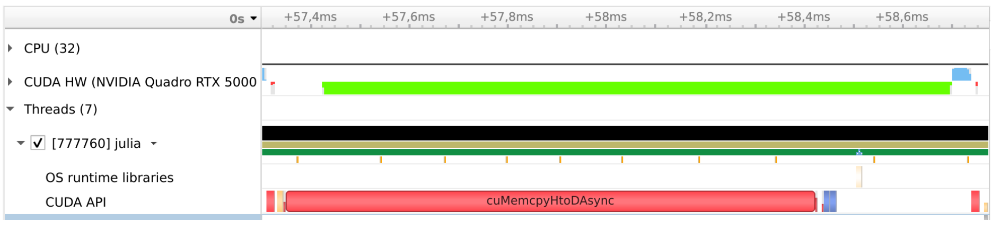

This has several disadvantages:
- the copy does not start right away; as there need to be some data in the staging buffer
- the CPU is kept busy during the copy (complicating concurrent GPU computing)

If instead we copy to a pinned buffer, the copy operation starts straight away without keeping the CPU busy:

```
a = Array(...)
Mem.pin(a)
b = CuArray(a)
consume(b)
```

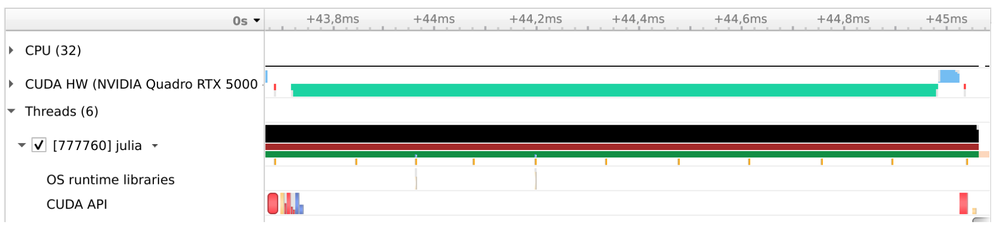

This not only avoids blocking the CPU, but may also speed up the operation by avoiding the copy to a staging buffer.

There is no free lunch, of course:

- pinning memory is expensive, so make sure to pre-allocate and pin the necessary buffers beforehand
- pinning too much memory will reduce overall system performance

## Textures

Textures are read-only, global memory buffers that are optimized for image-like operations:
- memory reads use a special cache optimized for spatial locality (in coordinate space)
- dedicated filtering hardware makes certain operations really cheap

CUDA's hardware support for textures is fairly limited, e.g., it only supports 1, 2 or 4 channels, so let's use an RGBA test image.

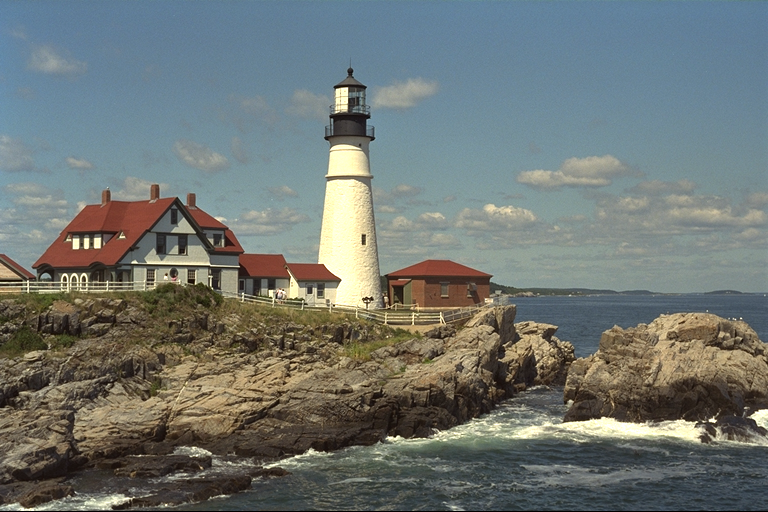

In [20]:
using Images, TestImages, ColorTypes, FixedPointNumbers
img = RGBA{N0f8}.(testimage("lighthouse"))

CUDA.jl also only supports "plain" datatypes (scalars, of tuples of scalars), so we reinterpret our image:

In [21]:
img′ = reinterpret(NTuple{4,UInt8}, img);

To use this image as a texture on the device, we need to create a `CuTexture` object. These objects take a data source, either a `CuArray`, or a `CuTextureArray` which is an opaque, pitched array that can be read more efficiently.

In [22]:
texturearray = CuTextureArray(img′);
texture = CuTexture(texturearray; normalized_coordinates=true)

512×768 4-channel CuTexture(::CuTextureArray) with eltype NTuple{4, UInt8}

Now we can pass this texture to a kernel. Note that I chose to use normalized coordinates, which means we'll index the texture using values in `[0,1]`.

In [23]:
function warp(dst, texture)
    tid = threadIdx().x + (blockIdx().x - 1) * blockDim().x
    I = CartesianIndices(dst)
    @inbounds if tid <= length(I)
        i,j = Tuple(I[tid])
        u = Float32(i-1) / Float32(size(dst, 1)-1)
        v = Float32(j-1) / Float32(size(dst, 2)-1)
        x = u + 0.02f0 * sin(30v)
        y = v + 0.03f0 * sin(20u)
        dst[i,j] = texture[x,y]
    end
    return
end

# the size of the destination determines how much we warp
outimg_d = CuArray{eltype(img′)}(undef, 500, 1000);

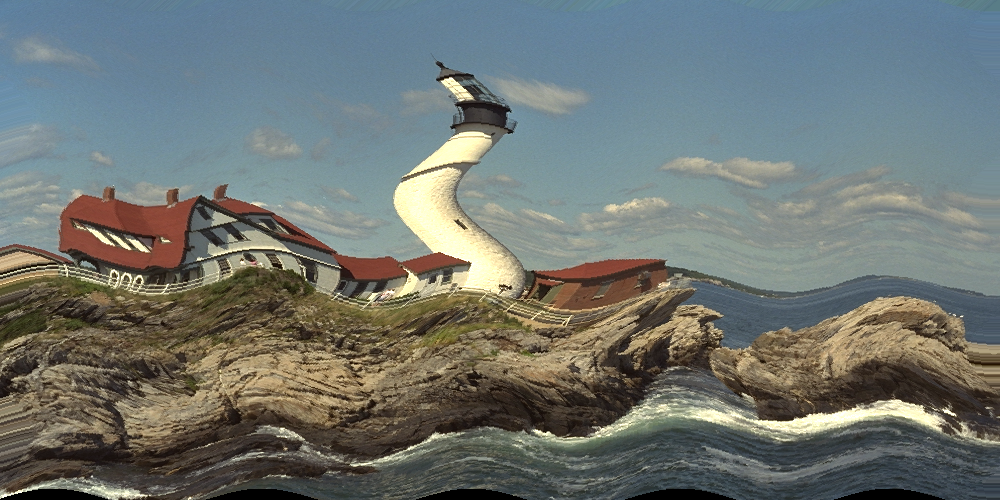

In [24]:
threads = 256
blocks = cld(length(outimg_d), threads)
@cuda threads=threads blocks=blocks warp(outimg_d, texture)

outimg = Array(outimg_d)
reinterpret(eltype(img), outimg)

### Clamping

By default, CUDA.jl uses the clamping address mode which repeats the last pixel when going out of bounds. There are several [other clamping modes](https://docs.nvidia.com/cuda/cuda-driver-api/group__CUDA__TYPES.html#group__CUDA__TYPES_1gc925457ee7128d6251071f6ff7608887) you can use: border, mirror and wrap.

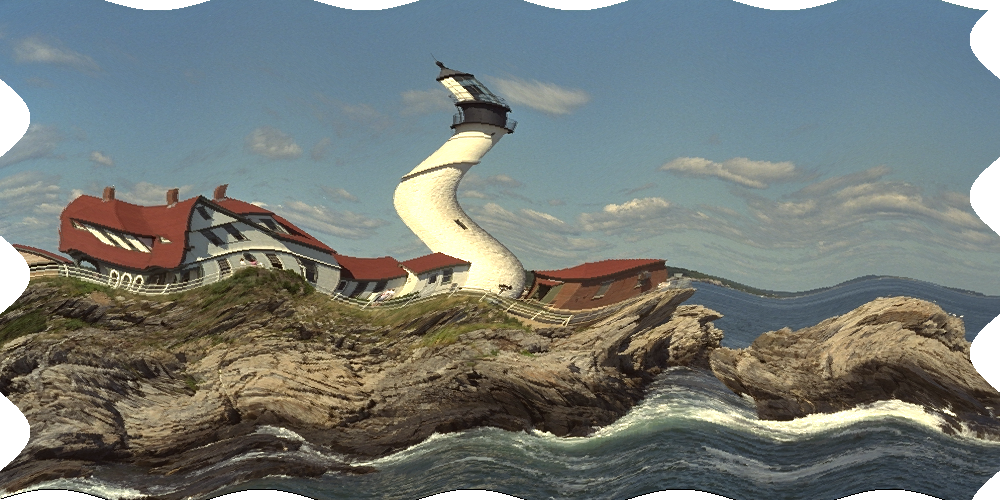

In [25]:
texture = CuTexture(texturearray; normalized_coordinates=true, address_mode=CUDA.ADDRESS_MODE_BORDER)
@cuda threads=threads blocks=blocks warp(outimg_d, texture)
outimg = Array(outimg_d)
reinterpret(eltype(img), outimg)

### Generalized interpolations

CUDA's hardware only supports a number of interpolation modes: nearest-neighbour, and linear. CUDA.jl extends that by implementing additional filtering modes, currently only cubic interpolation, on top of the hardware-accelerated ones. For example:

In [26]:
texture = CuTexture(texturearray; interpolation=CUDA.CubicInterpolation())

512×768 4-channel CuTexture(::CuTextureArray) with eltype NTuple{4, UInt8}

In [27]:
# cubic interpolation is currently only implemented for non-normalized coordinates
function warp2(dst, texture)
    tid = threadIdx().x + (blockIdx().x - 1) * blockDim().x
    I = CartesianIndices(dst)
    @inbounds if tid <= length(I)
        i,j = Tuple(I[tid])
        u = Float32(i-1) / Float32(size(dst, 1)-1)
        v = Float32(j-1) / Float32(size(dst, 2)-1)
        x = u + 0.02f0 * sin(30v)
        y = v + 0.03f0 * sin(20u)
        dst[i,j] = texture[1+size(texture, 1)*x,
                           1+size(texture, 2)*y]
    end
    return
end

# the size of the destination determines how much we warp
outimg_d = CuArray{eltype(img′)}(undef, 500, 1000);

<div class="alert alert-block alert-info"> Note how this kernel does not use normalized coordinates. </div>

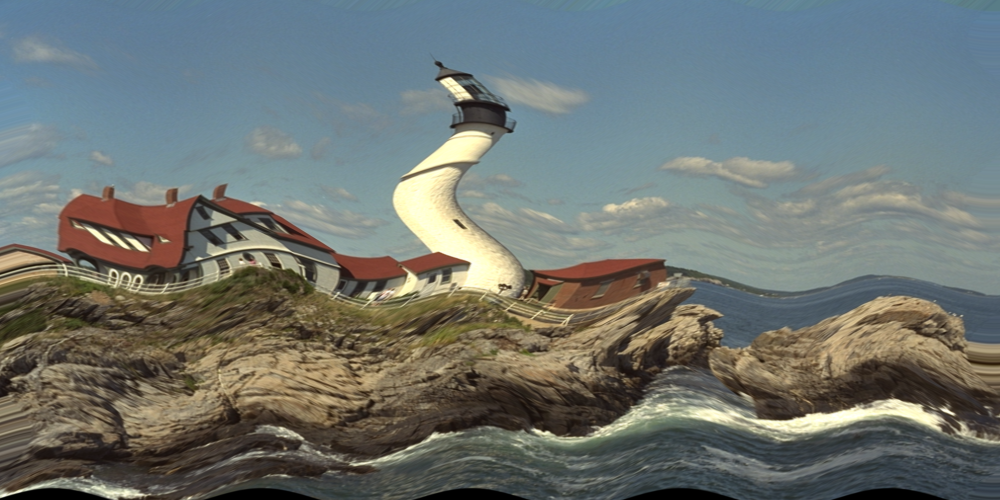

In [28]:
threads = 256
blocks = cld(length(outimg_d), threads)
@cuda threads=threads blocks=blocks warp2(outimg_d, texture)

outimg = Array(outimg_d)
reinterpret(eltype(img), outimg)

## Memory copying

When you call `Array(::CuArray)` or vice versa, there are several functions involved:

1. `copyto!` taking an array, performing bounds checks
2. `unsafe_copyto!` taking an array, copying the array's data and metadata
3. `unsafe_copyto!` taking pointers, performing the actual memory copying

There is generally no reason to use any of these lower-level methods, with one exception.

### Pitched arrays

CUDA supports pitched arrays -- arrays whose row size includes padding:

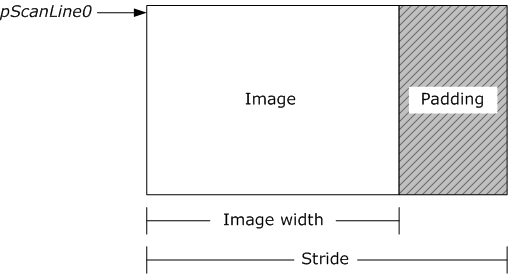

To work with these arrays, there are specialized 2D and 3D `memcpy` functions that take strides into account. Although CUDA.jl does not support pitched arrays, the specialized memory copy routines can be useful to copy several slices of an array at once, e.g., to modify parts of a matrix.

In [29]:
A = CUDA.zeros(Int, 5, 10)

5×10 CuArray{Int64, 2, CUDA.DeviceMemory}:
 0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0

In [30]:
B = ones(Int, 3, 8)

3×8 Matrix{Int64}:
 1  1  1  1  1  1  1  1
 1  1  1  1  1  1  1  1
 1  1  1  1  1  1  1  1

In [34]:
CUDA.unsafe_copy2d!(pointer(A), CUDA.DeviceMemory, pointer(B), CUDA.HostMemory,
                    size(B, 1), size(B, 2); dstPos=(2,2),
                    dstPitch=stride(A, 2)*sizeof(Int))
A

5×10 CuArray{Int64, 2, CUDA.DeviceMemory}:
 0  0  0  0  0  0  0  0  0  0
 0  1  1  1  1  1  1  1  1  0
 0  1  1  1  1  1  1  1  1  0
 0  1  1  1  1  1  1  1  1  0
 0  0  0  0  0  0  0  0  0  0

This can be useful to improve performance, since it only requires a single API call for what would otherwise have consisted of multiple individual copies of linear memory. A similar function exists for 3D copies.